# Homework 3 Template
This is the template for the third homework assignment.
Below are some class and function templates which we require you to fill out.
These will be tested by the autograder, so it is important to not edit the function definitions.
The functions have python docstrings which should indicate what the input and output arguments are.

## Instructions for the Autograder
When you submit your code to the autograder on Gradescope, you will need to comment out any code which is not an import statement or contained within a function definition.

In [1]:
############################################################
# Imports
############################################################
# Include your imports here, if any are used.
import numpy as np
import torch
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.autograd import Variable
from torchvision import transforms
import torchvision
import torchvision.transforms as transforms

In [2]:
def extract_data(x_data_filepath, y_data_filepath):
    X = np.load(x_data_filepath)
    y = np.load(y_data_filepath)
    return X, y

In [4]:
############################################################
# Extracting and loading data
############################################################
class Dataset(Dataset):
    """CIFAR-10 image dataset."""
    def __init__(self, X, y, transformations=None):

        self.len = len(X)           
        self.x_data = torch.from_numpy(X).float()
        self.y_data = torch.from_numpy(y).long()
    
    def __len__(self):
        return self.len

    def __getitem__(self, idx):
        return self.x_data[idx], self.y_data[idx]

In [5]:
############################################################
# Feed Forward Neural Network
############################################################

class FeedForwardNN(nn.Module):
    """ 
        (1) Use self.fc1 as the variable name for your first fully connected layer
        (2) Use self.fc2 as the variable name for your second fully connected layer
    """

    def __init__(self):
        
        super().__init__()
        self.fc1 = nn.Linear(32*32*3, 1500)
        self.fc2 = nn.Linear(1500, 10)

    def forward(self, x): 
            
        out = x.view(x.size(0), -1)
        out = Variable(out)
        out = out.float()

        out = F.sigmoid(self.fc1(out)) 
        out = F.sigmoid(self.fc2(out)) 
        return out
        
    """ 
        Please do not change the functions below. 
        They will be used to test the correctness of your implementation 
    """
    def get_fc1_params(self):
        return self.fc1.__repr__()
    
    def get_fc2_params(self):
        return self.fc2.__repr__()



In [163]:
############################################################
# Convolutional Neural Network
############################################################

class ConvolutionalNN(nn.Module):
    """ 
        (1) Use self.conv1 as the variable name for your first convolutional layer
        (2) Use self.pool as the variable name for your pooling layer
        (3) User self.conv2 as the variable name for your second convolutional layer
        (4) Use self.fc1 as the variable name for your first fully connected layer
        (5) Use self.fc2 as the variable name for your second fully connected layer
        (6) Use self.fc3 as the variable name for your third fully connected layer
    """
    # Layer Hyperparameters 
    # Tunning. convolutional kernel size [3x3, 5x5, 7x7],
    # Convolution1           Kernel=(3x3), Out channels=7, stride=1, padding=0. Then use ReLU 
    # Pool1                  MaxPool operation. Kernel size=(2x2) 
    # Convolution2           Kernel=(3x3), Out channels=16, stride=1, padding=0. Then use ReLU 
    # Fully Connected1       Out channels=130. Then use ReLU 
    # Fully Connected2       Out channels=72. Then use ReLU 
    # Fully Connected3       Out channels=10. Then use Sigmoid

    def __init__(self):
        super(ConvolutionalNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 7, 3, 1, 0)  
        self.pool = nn.MaxPool2d(2) 
        self.conv2 = nn.Conv2d(7, 16, 3, 1, 0) 
        self.fc1 = nn.Linear( 2704, 130)
        self.fc2 = nn.Linear( 130,72)
        self.fc3 = nn.Linear( 72, 10)        
        
    def forward(self, x):
        
        out = Variable(x)

        out = out.float()

        in_size = out.size(0)
        
        out = F.relu(self.conv1(out))

        out = self.pool(out)

        out = F.relu(self.conv2(out))

        out = out.view(in_size, -1) # flatten the tensor, Reshape to column vector

        out = F.relu(self.fc1(out))

        out = F.relu(self.fc2(out))

        out = F.sigmoid(self.fc3(out))

        return out
    """ 
        Please do not change the functions below. 
        They will be used to test the correctness of your implementation 
    """
    def get_conv1_params(self):
        return self.conv1.__repr__()
    
    def get_pool_params(self):
        return self.pool.__repr__()

    def get_conv2_params(self):
        return self.conv2.__repr__()
    
    def get_fc1_params(self):
        return self.fc1.__repr__()
    
    def get_fc2_params(self):
        return self.fc2.__repr__()
    
    def get_fc3_params(self):
        return self.fc3.__repr__()

In [45]:
def normalize_image(image):
    """
    Normalizes the RGB pixel values of an image.

    Args:
        image (3D NumPy array): For example, it should take in a single 3x32x32 image from the CIFAR-10 dataset
    Returns:
        tuple: The normalized image
    """
    meanR,stdR = np.mean(image[0]), np.std(image[0])
    meanG,stdG = np.mean(image[1]), np.std(image[1])
    meanB,stdB = np.mean(image[2]), np.std(image[2])
    
    R = (image[0] - meanR) / stdR
    G = (image[1] - meanG) / stdG
    B = (image[2] - meanB) / stdB
    
    return np.array([R,G,B])

In [104]:
############################################################
# Hyperparameterized Feed Forward Neural Network
############################################################
class HyperParamsFeedForwardNN(nn.Module):
    def __init__(self, sizes=[3072, 1500, 10]):
        
        super().__init__()
        self.layers = len(sizes) - 1
        self.fc1 = nn.Linear(sizes[0], sizes[1])
        if self.layers >= 2:
            self.fc2 = nn.Linear(sizes[1], sizes[2])
        if self.layers >= 3:
            self.fc3 = nn.Linear(sizes[2], sizes[3])
        if self.layers >= 4:
            self.fc4 = nn.Linear(sizes[3], sizes[4])   
    def forward(self, x): 
        
        out = x.view(x.size(0), -1)
        
        out = Variable(out)
        out = out.float()
  
        out = F.sigmoid(self.fc1(out)) 
        if self.layers >= 2: 
            out = F.sigmoid(self.fc2(out))
        if self.layers >= 3: 
            out = F.sigmoid(self.fc3(out))
        if self.layers >= 4: 
            out = F.sigmoid(self.fc4(out))
            
        return out

In [144]:
############################################################
# Hyperparameterized Convolutional Neural Network
############################################################
class HyperParamsConvNN(nn.Module):
    # 3. convolutional kernel size [3x3, 5x5, 7x7],
    # 4. number of neurons in the fully connected layers [your choices], and
    # 5. number of fully connected layers [your choices]
    
    def __init__(self, kernel_size = 3, image_size = 32, sizes=[2704, 1500, 10]):
        super(HyperParamsConvNN, self).__init__()
        self.layers = len(sizes) - 1
        self.conv1 = nn.Conv2d(3, 7, kernel_size=kernel_size, stride=1, padding=0)  
        self.pool = nn.MaxPool2d(2) 
        self.conv2 = nn.Conv2d(7, 16, kernel_size=kernel_size, stride=1, padding=0) 
        
        self.fc1 = nn.Linear( sizes[0], sizes[1])
        if self.layers >= 2:
            self.fc2 = nn.Linear( sizes[1],sizes[2])
        if self.layers >= 3:
            self.fc3 = nn.Linear( sizes[2], sizes[3])        
        if self.layers >= 4:
            self.fc4 = nn.Linear( sizes[3], sizes[4])
    def forward(self, x):
        out = Variable(x)
        out = out.float()
        #print('1 = ', out.shape)
        in_size = out.size(0)
        
        out = F.relu(self.conv1(out))
        #print('2 = ', out.shape)
        out = self.pool(out)
        #print('3 = ', out.shape)
        out = F.relu(self.conv2(out))
        print('4 = ', out.shape)
        out = out.view(in_size, -1)
        print('5 = ', out.shape)
        out = F.relu(self.fc1(out))
        print('6 = ', out.shape)
        if self.layers >= 2:
            out = F.relu(self.fc2(out))
            #print('7 = ', out.shape)
        if self.layers >= 3:
            out = F.sigmoid(self.fc3(out))
            #print('8 = ', out.shape)
        if self.layers >= 4:
            out = F.sigmoid(self.fc4(out))

        return out

In [10]:
# Default Parameters
# 1. SGD as the optimizer #
# 2. 0.001 as the learning rate #
# 3. 0.9 as the momentum #
# 4. 64 as the batch size # 
# 5. 100 as the maximum number of epochs
# 6. Cross-entropy loss as the loss function # 

###############################
# Parameters for Tunning
# 1. batch size [64, 128, 256],
# 2. learning rate [0.005, 0.003, 0.001]
# 3. convolutional kernel size [3x3, 5x5, 7x7],
# 4. number of neurons in the fully connected layers [your choices], and
# 5. number of fully connected layers [your choices]

In [11]:
############################################################
# Run Experiment
############################################################

def run_experiment(neural_network, train_loader, test_loader, loss_function, optimizer):

    
    # Note: train on one pass, predict on another pass; calculate the mean for all(counter outside for loop)  
    max_epoches = 2

    train_accuracys = np.zeros((max_epoches))
    test_accuracys = np.zeros((max_epoches))
    losses = np.zeros((max_epoches))
    
    for epoch in range(max_epoches):
        #print('epoch = ', epoch)

        
        ############ Train the Model
        for i,data in enumerate(train_loader, 0):

            inputs, labels = data
            inputs, labels = Variable(inputs), Variable(labels)
            
            y_pred = neural_network(inputs)
            loss = loss_function(y_pred, labels)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        
        ############ Compute the training accuracy and training loss
        correct_train, total_train = 0.0, 0.0
        training_loss = 0.0
        for i, data in enumerate (train_loader, 0):
            train_inputs, train_labels = data
            train_inputs, train_labels = Variable(train_inputs), Variable(train_labels)
            
            train_pred = neural_network(train_inputs)
            training_loss += loss.item()
            train_pred = train_pred.data.numpy()
            train_labels = train_labels.data.numpy()
            
            correct_train += sum(np.equal(train_pred.argmax(axis = 1), train_labels).astype(int))
            total_train += len(train_labels)

        loss = training_loss / i     
        train_accuracy = correct_train / total_train  
        #print('Train Loss: ', loss)
        #print('Train accuracy: ', train_accuracy)
        losses[epoch] = loss
        train_accuracys[epoch] = train_accuracy   
        
        ############ Compute the test accuracy
        correct_test, total_test= 0, 0
        for i, data_test in enumerate(test_loader, 0):
            images_test, labels_test = data_test
            images_test, labels_test = Variable(images_test), Variable(labels_test)
            outputs_test = neural_network(images_test)
            
            outputs_test = outputs_test.data.numpy()
            labels_test = labels_test.data.numpy()
            
            correct_test += sum(np.equal(outputs_test.argmax(axis = 1), labels_test).astype(int))
            total_test += len(outputs_test)
            
        test_accuracy =   correct_test / total_test
        #print('test accuracy: ', test_accuracy)
        test_accuracys[epoch] = test_accuracy
        
    train_accuracys_res = train_accuracys
    #print(train_accuracys_res)
    return train_accuracys[-1] , test_accuracys[-1], losses[-1]


In [153]:
############################################################
# Run Experiment For Plot
############################################################

def run_experiment_plot(neural_network, train_loader, test_loader, loss_function, optimizer):

    # Note: train on one pass, predict on another pass; calculate the mean for all(counter outside for loop)  
    max_epoches = 100

    train_accuracys = np.zeros((max_epoches))
    test_accuracys = np.zeros((max_epoches))
    losses = np.zeros((max_epoches))
    
    for epoch in range(max_epoches):
        print('epoch = ', epoch)

        
        ############ Train the Model
        for i,data in enumerate(train_loader, 0):

            inputs, labels = data
            inputs, labels = Variable(inputs), Variable(labels)
            
            y_pred = neural_network(inputs)
            loss = loss_function(y_pred, labels)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
       
        
        ############ Compute the training accuracy and training loss
        correct_train, total_train = 0.0, 0.0
        training_loss = 0.0
        for i, data in enumerate (train_loader, 0):
            train_inputs, train_labels = data
            train_inputs, train_labels = Variable(train_inputs), Variable(train_labels)
            
            train_pred = neural_network(train_inputs)
            training_loss += loss.item()
            train_pred = train_pred.data.numpy()
            train_labels = train_labels.data.numpy()
            
            correct_train += sum(np.equal(train_pred.argmax(axis = 1), train_labels).astype(int))
            total_train += len(train_labels)

        loss = training_loss / i    
        train_accuracy = correct_train / total_train  
        #print('Train Loss: ', loss)
        print('Train accuracy: ', train_accuracy)
        losses[epoch] = loss
        train_accuracys[epoch] = train_accuracy   
        
        ############ Compute the test accuracy
        correct_test, total_test= 0, 0
        for i, data_test in enumerate(test_loader, 0):
            images_test, labels_test = data_test
            images_test, labels_test = Variable(images_test), Variable(labels_test)
            outputs_test = neural_network(images_test)
            
            outputs_test = outputs_test.data.numpy()
            labels_test = labels_test.data.numpy()
            
            correct_test += sum(np.equal(outputs_test.argmax(axis = 1), labels_test).astype(int))
            total_test += len(outputs_test)
            
        test_accuracy =   correct_test / total_test
        print('test accuracy: ', test_accuracy)
        test_accuracys[epoch] = test_accuracy
    print("Train accuracy= ",train_accuracys[-1],
          ", test_accuracy= ", test_accuracys[-1],
          ", loss= ",losses[-1])
    return (train_accuracys,test_accuracys,losses)


In [56]:
# X_train, y_train =  extract_data('cifar10-data/train_images.npy', 'cifar10-data/train_labels.npy')
# X_train_norm = []
# for e in X_train: X_train_norm.append(normalize_image(e))
# X_train_norm = np.asarray(X_train_norm)

# X_test, y_test =  extract_data('cifar10-data/test_images.npy', 'cifar10-data/test_labels.npy')
# X_test_norm = []
# for e in X_test: X_test_norm.append(normalize_image(e))
# X_test_norm = np.asarray(X_test_norm)



In [135]:
# ##########################
# # Define Loss Function and Optimizer

# # ffnet (input_size=3072, hidden_size=1500, output_size=10)
# # Specify the network architecture 
# fnn = FeedForwardNN()
# cnn = ConvolutionalNN()



# # Specify the training dataset and test dataset  
# # Tunning. batch size [64, 128, 256]  
# train_dataset = Dataset(X_train, y_train)
# train_dataset_norm = Dataset(X_train_norm, y_train_norm)

# train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
# train_loader_norm = DataLoader(train_dataset_norm, batch_size=64, shuffle=True) 

# train_loader_128 = DataLoader(train_dataset, batch_size=128, shuffle=True) 
# train_loader_256 = DataLoader(train_dataset, batch_size=256, shuffle=True) 


# test_dataset = Dataset(X_test, y_test)
# test_dataset_norm = Dataset(X_test_norm, y_test_norm)

# test_loader = DataLoader(test_dataset, batch_size=64, shuffle=True)  
# test_loader_norm = DataLoader(test_dataset_norm, batch_size=64, shuffle=True) 

# test_loader_128 = DataLoader(test_dataset, batch_size=128, shuffle=True) 
# test_loader_256 = DataLoader(test_dataset, batch_size=256, shuffle=True) 

# # Specify the loss function
# criterion = nn.CrossEntropyLoss()

# # Specify the optimizer
# # Tunning. learning rate [0.005, 0.003, 0.001]
# optimizer_fnn = optim.SGD(fnn.parameters(), lr=0.001, momentum=0.9)
# optimizer_cnn = optim.SGD(cnn.parameters(), lr=0.001, momentum=0.9)



In [58]:
# # Experiment 1
# fnn_res = run_experiment_plot(fnn, train_loader, test_loader, criterion, optimizer_fnn )
# train_accuracys_fnn,test_accuracys_fnn, losses_fnn = fnn_res[0], fnn_res[1], fnn_res[2]   

Train accuracy=  0.3761 , test_accuracy=  0.3495 , loss=  2.065364805551676


In [140]:
# cnn_res = run_experiment_plot(cnn, train_loader, test_loader, criterion, optimizer_cnn )

epoch =  0
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

In [162]:
# # Experiment 2
# cnn_res = run_experiment_plot(cnn, train_loader, test_loader, criterion, optimizer_cnn )
# train_accuracys_cnn,test_accuracys_cnn, losses_cnn = cnn_res[0], cnn_res[1], cnn_res[2]  

epoch =  0
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
test accuracy:  0.4475
epoch =  11
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
test accuracy:  0.458
epoch =  15
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
Train accura

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
test accuracy:  0.481
epoch =  24
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  t

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
Train accuracy:  0.6599
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
Train accuracy:  0.7034
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
test accurac

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
Train accuracy:  0.8076
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 1

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
Train accura

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
Train accuracy:  0.8536
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
test accuracy:  0.488
epoch =  78
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
test accuracy:  0.4865
epoch =  79
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
test accuracy:  0.4875
epoch =  89
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
Train accuracy:  0.8699
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
Train accuracy:  0.87
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7,

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([16, 3, 32, 32])
2 =  torch.Size([16, 3, 32, 32])
3 =  torch.Size([16, 7, 30, 30])
4 =  torch.Size([16, 7, 15, 15])
5 =  torch.Size([16, 16, 13, 13])
6 =  torch.Size([16, 2704])
7 =  torch.Size([16, 130])
8 =  torch.Size([16, 72])
Train accuracy:  0.8709
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Siz

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

In [137]:
# # Experiment 3
# cnn_res_norm = run_experiment_plot(cnn, train_loader_norm, test_loader, criterion, optimizer_cnn )
# train_accuracys_cnn_norm,test_accuracys_cnn_norm, losses_cnn_norm = cnn_res_norm[0], cnn_res_norm[1], cnn_res_norm[2]    

epoch =  0
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1

7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.S

3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.S

1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.Size([64, 3, 32, 32])
2 =  torch.Size([64, 3, 32, 32])
3 =  torch.Size([64, 7, 30, 30])
4 =  torch.Size([64, 7, 15, 15])
5 =  torch.Size([64, 16, 13, 13])
6 =  torch.Size([64, 2704])
7 =  torch.Size([64, 130])
8 =  torch.Size([64, 72])
1 =  torch.S

In [21]:
# # Experiment 4.1  -- fnn: batch size= 128
# fnn_res_41 = run_experiment_plot(cnn, train_loader_norm, test_loader_norm, criterion, optimizer_cnn )
# train_accuracys_cnn_norm,test_accuracys_cnn_norm, losses_cnn_norm 
# = cnn_res_norm[0], cnn_res_norm[1], cnn_res_norm[2]  

In [61]:
def plot_result(train_accuracys,test_accuracys, losses, epoches ,title_name):   
    f,ax = plt.subplots(1, sharey=True, facecolor = 'w')
    plt.xlabel('Number of epochs')
    ax.set_ylabel('Accuracy', color='r')
    l1, =ax.plot(range(epoches), train_accuracys, 'o-')
    l2, =ax.plot(range(epoches), test_accuracys, 'v-')
    ax.tick_params('y', colors='r')
    
    ax2 = ax.twinx()
    l3, =ax2.plot(range(epoches), losses, '*-')
    ax2.set_ylabel('loss', color='b')
    ax2.tick_params('y', colors='b')
    l3.set_dashes([2, 2, 10, 2]) 
    
    plt.legend(handles = [l1,l2,l3], labels = ['train_accuracy','test_accuracys','losses'],loc = 'best')
    plt.title(title_name)
    plt.show()
    


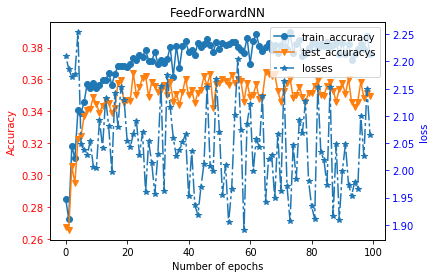

In [63]:
# # Exp 1:
# plot_result(train_accuracys_fnn,test_accuracys_fnn,losses_fnn,100,'FeedForwardNN')

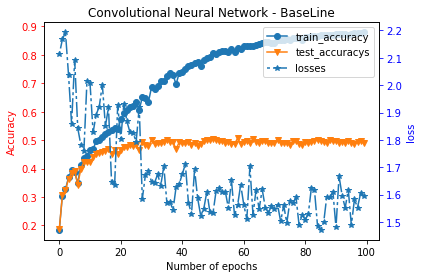

In [65]:
# # Exp 2:
# plot_result(train_accuracys_cnn,test_accuracys_cnn,losses_cnn,100, 'Convolutional Neural Network - BaseLine')

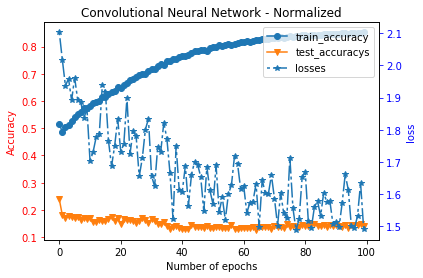

In [66]:
# # CNN-normalized
# plot_result(train_accuracys_cnn_norm,
#             test_accuracys_cnn_norm,
#             losses_cnn_norm,100, 
#             'Convolutional Neural Network - Normalized')

In [117]:
def plot_compare1(cnn_data,cnn_data_norm,data_name,title_name, y_label,epoches):   
    f,ax = plt.subplots(1, sharey=True, facecolor = 'w')
    plt.xlabel('Number of epochs')
    ax.set_ylabel(y_label, color='r')
    l1, =ax.plot(range(epoches), cnn_data, 'o-')
    l2, =ax.plot(range(epoches), cnn_data_norm, 'v-')
    ax.tick_params('y', colors='r')  
    plt.legend(handles = [l1,l2], labels = ['cnn_'+data_name,'cnn_normed_'+data_name],loc = 'best')
    plt.title(title_name)
    plt.show()
    
    

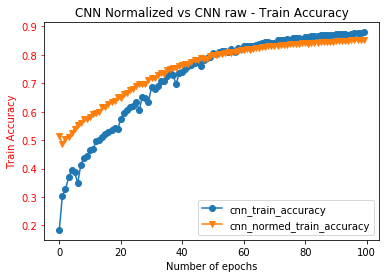

In [118]:
# # CNN-normalized vs CNN-row - Train accuracy
# plot_compare1(train_accuracys_cnn,train_accuracys_cnn_norm,'train_accuracy', 'CNN Normalized vs CNN raw - Train Accuracy','Train Accuracy',100)

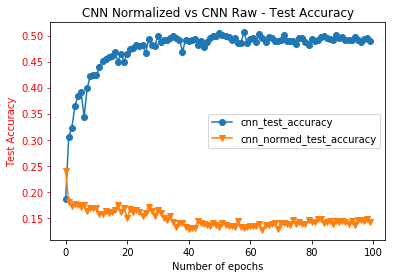

In [119]:
# # CNN-normalized vs CNN-row - Test accuracy
# plot_compare1(test_accuracys_cnn,test_accuracys_cnn_norm,'test_accuracy', 'CNN Normalized vs CNN Raw - Test Accuracy','Test Accuracy',100)

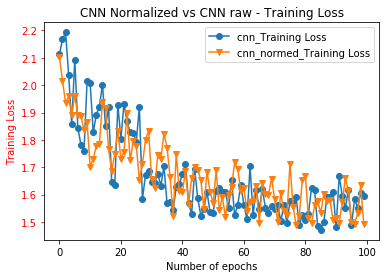

In [120]:
# # CNN-normalized vs CNN-row - Training Loss
# plot_compare1(losses_cnn,losses_cnn_norm,'Training Loss', 'CNN Normalized vs CNN raw - Training Loss','Training Loss',100)

epoch =  0
Train accuracy:  0.2826
test accuracy:  0.2665
epoch =  1
Train accuracy:  0.3052
test accuracy:  0.295
epoch =  2
Train accuracy:  0.3231
test accuracy:  0.305
epoch =  3
Train accuracy:  0.3271
test accuracy:  0.319
epoch =  4
Train accuracy:  0.3227
test accuracy:  0.3115
epoch =  5
Train accuracy:  0.347
test accuracy:  0.3325
epoch =  6
Train accuracy:  0.3584
test accuracy:  0.3435
epoch =  7
Train accuracy:  0.3588
test accuracy:  0.3415
epoch =  8
Train accuracy:  0.3611
test accuracy:  0.3445
epoch =  9
Train accuracy:  0.3676
test accuracy:  0.3475
epoch =  10
Train accuracy:  0.3684
test accuracy:  0.35
epoch =  11
Train accuracy:  0.3653
test accuracy:  0.3545
epoch =  12
Train accuracy:  0.3722
test accuracy:  0.3545
epoch =  13
Train accuracy:  0.3711
test accuracy:  0.356
epoch =  14
Train accuracy:  0.3752
test accuracy:  0.353
epoch =  15
Train accuracy:  0.3798
test accuracy:  0.3625
epoch =  16
Train accuracy:  0.3795
test accuracy:  0.3545
epoch =  17
Tra

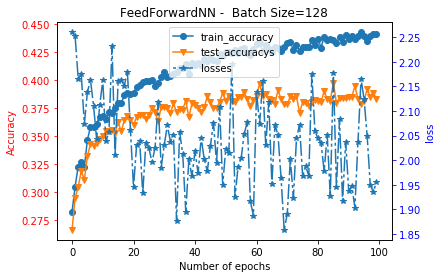

In [82]:
# # Group 1 - Exp 4.1 FNN - batch size 128
# fnn_128 = FeedForwardNN()
# optimizer_fnn_128 = optim.SGD(fnn_128.parameters(), lr=0.001, momentum=0.9)
# fnn_res_128 = run_experiment_plot(fnn_128, train_loader_128, test_loader_128, criterion, optimizer_fnn_128 )
# train_accuracys_fnn_128,test_accuracys_fnn_128, losses_fnn_128 = fnn_res_128[0], fnn_res_128[1], fnn_res_128[2]   
# plot_result(train_accuracys_fnn_128,test_accuracys_fnn_128,losses_fnn_128,100,'FeedForwardNN -  Batch Size=128')


epoch =  0
Train accuracy:  0.2575
test accuracy:  0.237
epoch =  1
Train accuracy:  0.2791
test accuracy:  0.2675
epoch =  2
Train accuracy:  0.2979
test accuracy:  0.292
epoch =  3
Train accuracy:  0.319
test accuracy:  0.308
epoch =  4
Train accuracy:  0.3281
test accuracy:  0.317
epoch =  5
Train accuracy:  0.3353
test accuracy:  0.3095
epoch =  6
Train accuracy:  0.3458
test accuracy:  0.3225
epoch =  7
Train accuracy:  0.3383
test accuracy:  0.326
epoch =  8
Train accuracy:  0.3548
test accuracy:  0.3405
epoch =  9
Train accuracy:  0.3503
test accuracy:  0.3355
epoch =  10
Train accuracy:  0.3592
test accuracy:  0.346
epoch =  11
Train accuracy:  0.3638
test accuracy:  0.3375
epoch =  12
Train accuracy:  0.3651
test accuracy:  0.3365
epoch =  13
Train accuracy:  0.3656
test accuracy:  0.3455
epoch =  14
Train accuracy:  0.3732
test accuracy:  0.35
epoch =  15
Train accuracy:  0.3734
test accuracy:  0.338
epoch =  16
Train accuracy:  0.378
test accuracy:  0.3575
epoch =  17
Train 

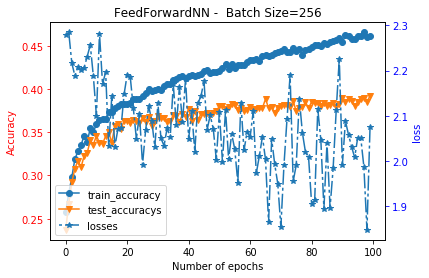

In [83]:
# # Group 1 - Exp 4.2 FNN - batch size 256
# fnn_256 = FeedForwardNN()
# optimizer_fnn_256 = optim.SGD(fnn_256.parameters(), lr=0.001, momentum=0.9)
# fnn_res_256 = run_experiment_plot(fnn_256, train_loader_256, test_loader_256, criterion, optimizer_fnn_256 )
# train_accuracys_fnn_256,test_accuracys_fnn_256, losses_fnn_256 = fnn_res_256[0], fnn_res_256[1], fnn_res_256[2]   
# plot_result(train_accuracys_fnn_256,test_accuracys_fnn_256,losses_fnn_256,100,'FeedForwardNN -  Batch Size=256')


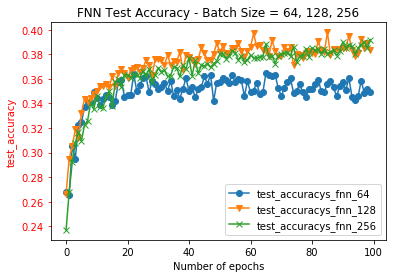

In [87]:
# # Group 1 batch size compraration
# f,ax = plt.subplots(1, sharey=True, facecolor = 'w')
# plt.xlabel('Number of epochs')
# ax.set_ylabel('test_accuracy', color='r')
# l1, =ax.plot(range(100), test_accuracys_fnn, 'o-')
# l2, =ax.plot(range(100), test_accuracys_fnn_128, 'v-')
# l3, =ax.plot(range(100), test_accuracys_fnn_256, 'x-')
# ax.tick_params('y', colors='r')  
# plt.legend(handles = [l1,l2,l3], labels = ['test_accuracys_fnn_64', 'test_accuracys_fnn_128','test_accuracys_fnn_256'],loc = 'best')
# plt.title('FNN Test Accuracy - Batch Size = 64, 128, 256')
# plt.show()


In [95]:
def plot_compare(ylabel, epoches, data1, data2, data3, label1, label2, label3, title_name):
    f,ax = plt.subplots(1, sharey=True, facecolor = 'w')
    plt.xlabel('Number of epochs')
    ax.set_ylabel(ylabel, color='r')
    l1, =ax.plot(range(epoches), data1, 'o-')
    l2, =ax.plot(range(epoches), data2, 'v-')
    l3, =ax.plot(range(epoches), data3, 'x-')
    ax.tick_params('y', colors='r')  
    plt.legend(handles = [l1,l2,l3], labels = [label1, label2,label3],loc = 'best')
    plt.title(title_name)
    plt.show()

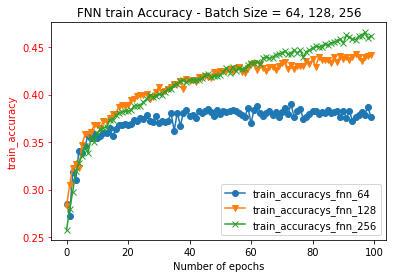

In [89]:
# # Group1 - batch size compraration
# f,ax = plt.subplots(1, sharey=True, facecolor = 'w')
# plt.xlabel('Number of epochs')
# ax.set_ylabel('train_accuracy', color='r')
# l1, =ax.plot(range(100), train_accuracys_fnn, 'o-')
# l2, =ax.plot(range(100), train_accuracys_fnn_128, 'v-')
# l3, =ax.plot(range(100), train_accuracys_fnn_256, 'x-')
# ax.tick_params('y', colors='r')  
# plt.legend(handles = [l1,l2,l3], labels = ['train_accuracys_fnn_64', 'train_accuracys_fnn_128','train_accuracys_fnn_256'],loc = 'best')
# plt.title('FNN train Accuracy - Batch Size = 64, 128, 256')
# plt.show()


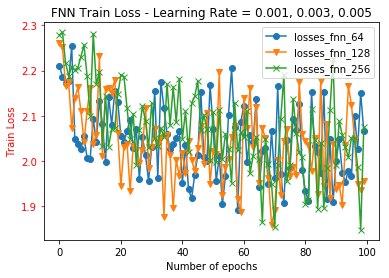

In [167]:
# # Group1- Learning Rate Comparation  - Test Loss
# plot_compare('Train Loss', 100, 
#              losses_fnn, losses_fnn_128, losses_fnn_256, 
#              'losses_fnn_64', 'losses_fnn_128', 'losses_fnn_256',
#              'FNN Train Loss - Learning Rate = 0.001, 0.003, 0.005')

In [90]:
# # Group2 -  CNN - learning rate 0.005
# cnn_lr5 = ConvolutionalNN()
# optimizer_cnn_lr5 = optim.SGD(cnn_lr5.parameters(), lr=0.005, momentum=0.9)
# cnn_res_lr5 = run_experiment_plot(cnn_lr5, train_loader, test_loader, criterion, optimizer_cnn_lr5 )
# train_accuracys_cnn_lr5,test_accuracys_cnn_lr5, losses_cnn_lr5 = cnn_res_lr5[0], cnn_res_lr5[1], cnn_res_lr5[2]   
# #plot_result(train_accuracys_cnn_lr5,test_accuracys_cnn_lr5,losses_cnn_lr5,100,'ConvolutionalNN - Learning Rate=0.005')


epoch =  0
Train accuracy:  0.2901
test accuracy:  0.278
epoch =  1
Train accuracy:  0.3534
test accuracy:  0.347
epoch =  2
Train accuracy:  0.3603
test accuracy:  0.3605
epoch =  3
Train accuracy:  0.4259
test accuracy:  0.4095
epoch =  4
Train accuracy:  0.458
test accuracy:  0.429
epoch =  5
Train accuracy:  0.4614
test accuracy:  0.4005
epoch =  6
Train accuracy:  0.5167
test accuracy:  0.4465
epoch =  7
Train accuracy:  0.5174
test accuracy:  0.426
epoch =  8
Train accuracy:  0.5292
test accuracy:  0.4375
epoch =  9
Train accuracy:  0.534
test accuracy:  0.435
epoch =  10
Train accuracy:  0.5463
test accuracy:  0.4215
epoch =  11
Train accuracy:  0.5931
test accuracy:  0.465
epoch =  12
Train accuracy:  0.6218
test accuracy:  0.456
epoch =  13
Train accuracy:  0.5688
test accuracy:  0.412
epoch =  14
Train accuracy:  0.6302
test accuracy:  0.4305
epoch =  15
Train accuracy:  0.6514
test accuracy:  0.449
epoch =  16
Train accuracy:  0.6754
test accuracy:  0.453
epoch =  17
Train a

NameError: name 'train_accuracys_cnn_lr5' is not defined

In [92]:
# # Group2 -  CNN - learning rate 0.003
# cnn_lr3 = ConvolutionalNN()
# optimizer_cnn_lr3 = optim.SGD(cnn_lr3.parameters(), lr=0.003, momentum=0.9)
# cnn_res_lr3 = run_experiment_plot(cnn_lr3, train_loader, test_loader, criterion, optimizer_cnn_lr3 )
# train_accuracys_cnn_lr3,test_accuracys_cnn_lr3, losses_cnn_lr3 = cnn_res_lr3[0], cnn_res_lr3[1], cnn_res_lr3[2]   
# #plot_result(train_accuracys_cnn_lr3,test_accuracys_cnn_lr3,losses_cnn_lr3,100,'ConvolutionalNN - Learning Rate=0.003')


epoch =  0
Train accuracy:  0.2914
test accuracy:  0.303
epoch =  1
Train accuracy:  0.3204
test accuracy:  0.3115
epoch =  2
Train accuracy:  0.3644
test accuracy:  0.3575
epoch =  3
Train accuracy:  0.4168
test accuracy:  0.4125
epoch =  4
Train accuracy:  0.4429
test accuracy:  0.429
epoch =  5
Train accuracy:  0.4479
test accuracy:  0.4095
epoch =  6
Train accuracy:  0.4825
test accuracy:  0.428
epoch =  7
Train accuracy:  0.4818
test accuracy:  0.4125
epoch =  8
Train accuracy:  0.5007
test accuracy:  0.4195
epoch =  9
Train accuracy:  0.5213
test accuracy:  0.4385
epoch =  10
Train accuracy:  0.548
test accuracy:  0.4585
epoch =  11
Train accuracy:  0.557
test accuracy:  0.4435
epoch =  12
Train accuracy:  0.6023
test accuracy:  0.4745
epoch =  13
Train accuracy:  0.6004
test accuracy:  0.459
epoch =  14
Train accuracy:  0.603
test accuracy:  0.451
epoch =  15
Train accuracy:  0.6314
test accuracy:  0.4575
epoch =  16
Train accuracy:  0.6803
test accuracy:  0.4815
epoch =  17
Tra

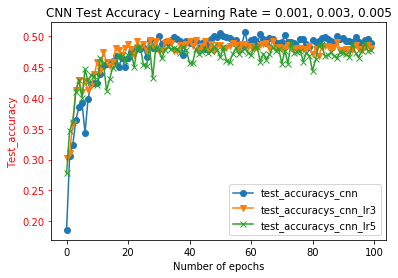

In [96]:
# # Group2 - Learning Rate Comparation  - Test Accuracy
# plot_compare('Test_accuracy', 100, 
#              test_accuracys_cnn, test_accuracys_cnn_lr3, train_accuracys_cnn_lr5, 
#              'test_accuracys_cnn', 'test_accuracys_cnn_lr3', 'test_accuracys_cnn_lr5',
#              'CNN Test Accuracy - Learning Rate = 0.001, 0.003, 0.005')

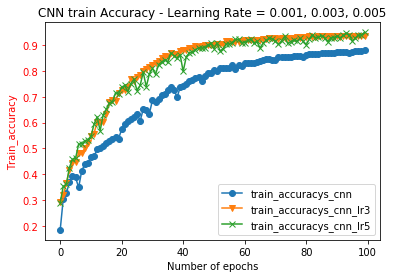

In [99]:
# # Group2  learning rate comparation - Train Accuracy
# plot_compare('Train_accuracy', 100, 
#              train_accuracys_cnn, train_accuracys_cnn_lr3, train_accuracys_cnn_lr5, 
#              'train_accuracys_cnn', 'train_accuracys_cnn_lr3', 'train_accuracys_cnn_lr5',
#              'CNN train Accuracy - Learning Rate = 0.001, 0.003, 0.005')

(1,)

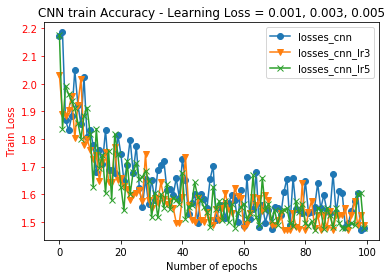

In [164]:
# # Group2  learning rate comparation - Train Loss
# plot_compare('Train Loss', 100, 
#              losses_cnn, losses_cnn_lr3, losses_cnn_lr5, 
#              'losses_cnn', 'losses_cnn_lr3', 'losses_cnn_lr5',
#              'CNN train Accuracy - Learning Loss = 0.001, 0.003, 0.005')

In [106]:
# # Group 3 - Compare the neuron sizes in FNNs - neurons sizes = [3072, 2000, 10]
# fnn_2000 = HyperParamsFeedForwardNN(sizes = [3072, 2000, 10])
# optimizer_fnn_2000 = optim.SGD(fnn_2000.parameters(), lr=0.001, momentum=0.9)
# fnn_res_2000 = run_experiment_plot(fnn_2000, train_loader, test_loader, criterion, optimizer_fnn_2000 )
# train_accuracys_2000,test_accuracys_fnn_2000, losses_fnn_2000 = fnn_res_2000[0], fnn_res_2000[1], fnn_res_2000[2]   



epoch =  0
Train accuracy:  0.2905
test accuracy:  0.279
epoch =  1
Train accuracy:  0.2983
test accuracy:  0.295
epoch =  2
Train accuracy:  0.3306
test accuracy:  0.3275
epoch =  3
Train accuracy:  0.3279
test accuracy:  0.3215
epoch =  4
Train accuracy:  0.3447
test accuracy:  0.332
epoch =  5
Train accuracy:  0.3486
test accuracy:  0.332
epoch =  6
Train accuracy:  0.3484
test accuracy:  0.344
epoch =  7
Train accuracy:  0.3494
test accuracy:  0.335
epoch =  8
Train accuracy:  0.3464
test accuracy:  0.333
epoch =  9
Train accuracy:  0.3566
test accuracy:  0.3395
epoch =  10
Train accuracy:  0.3637
test accuracy:  0.346
epoch =  11
Train accuracy:  0.3661
test accuracy:  0.3485
epoch =  12
Train accuracy:  0.3596
test accuracy:  0.347
epoch =  13
Train accuracy:  0.3739
test accuracy:  0.361
epoch =  14
Train accuracy:  0.3712
test accuracy:  0.3525
epoch =  15
Train accuracy:  0.375
test accuracy:  0.356
epoch =  16
Train accuracy:  0.3637
test accuracy:  0.342
epoch =  17
Train ac

NameError: name 'train_accuracys_fnn_2000' is not defined

In [ ]:
#plot_result(train_accuracys_2000,test_accuracys_fnn_2000,losses_fnn_2000,100,'FeedForwardNN - neurons sizes  = [3072,  2000, 10]')

In [108]:
# # Group 3 - Compare the neuron sizes in FNNs - neurons sizes = [3072, 2500, 10]
# fnn_2500 = HyperParamsFeedForwardNN(sizes = [3072, 2500, 10])
# optimizer_fnn_2500 = optim.SGD(fnn_2500.parameters(), lr=0.001, momentum=0.9)
# fnn_res_2500 = run_experiment_plot(fnn_2500, train_loader, test_loader, criterion, optimizer_fnn_2500 )
# train_accuracys_2500,test_accuracys_fnn_2500, losses_fnn_2500 = fnn_res_2500[0], fnn_res_2500[1], fnn_res_2500[2]   
# plot_result(train_accuracys_fnn_2500,test_accuracys_fnn_2500,losses_fnn_2500,100,'FeedForwardNN - neurons sizes  = [3072, 2500, 30]')


epoch =  0
Train accuracy:  0.308
test accuracy:  0.307
epoch =  1
Train accuracy:  0.3148
test accuracy:  0.319
epoch =  2
Train accuracy:  0.3383
test accuracy:  0.331
epoch =  3
Train accuracy:  0.3308
test accuracy:  0.3285
epoch =  4
Train accuracy:  0.3433
test accuracy:  0.3355
epoch =  5
Train accuracy:  0.3564
test accuracy:  0.343
epoch =  6
Train accuracy:  0.3466
test accuracy:  0.3405
epoch =  7
Train accuracy:  0.3603
test accuracy:  0.3445
epoch =  8
Train accuracy:  0.3649
test accuracy:  0.3465
epoch =  9
Train accuracy:  0.3591
test accuracy:  0.335
epoch =  10
Train accuracy:  0.373
test accuracy:  0.36
epoch =  11
Train accuracy:  0.3702
test accuracy:  0.352
epoch =  12
Train accuracy:  0.3874
test accuracy:  0.36
epoch =  13
Train accuracy:  0.3783
test accuracy:  0.351
epoch =  14
Train accuracy:  0.382
test accuracy:  0.3575
epoch =  15
Train accuracy:  0.3873
test accuracy:  0.3695
epoch =  16
Train accuracy:  0.3752
test accuracy:  0.3615
epoch =  17
Train acc

NameError: name 'train_accuracys_fnn_2500' is not defined

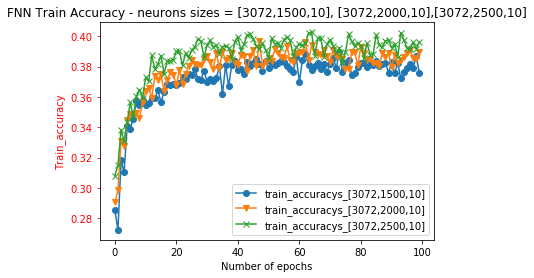

In [112]:
# # Group 3 - Compare the neuron sizes  - neurons sizes = [3072, 2000, 10]  - Train Accuracy
# plot_compare('Train_accuracy', 100, 
#              train_accuracys_fnn,train_accuracys_2000, train_accuracys_2500, 
#              'train_accuracys_[3072,1500,10]','train_accuracys_[3072,2000,10]', 'train_accuracys_[3072,2500,10]', 
#              'FNN Train Accuracy - neurons sizes = [3072,1500,10], [3072,2000,10],[3072,2500,10]')


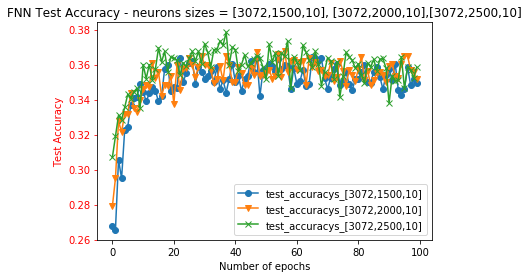

In [121]:
# # Group 3 - Compare the neuron sizes  - neurons sizes = [3072, 2000, 10]  - Test Accuracy
# plot_compare('Test Accuracy', 100, 
#              test_accuracys_fnn,test_accuracys_fnn_2000, test_accuracys_fnn_2500, 
#              'test_accuracys_[3072,1500,10]','test_accuracys_[3072,2000,10]', 'test_accuracys_[3072,2500,10]', 
#              'FNN Test Accuracy - neurons sizes = [3072,1500,10], [3072,2000,10],[3072,2500,10]')

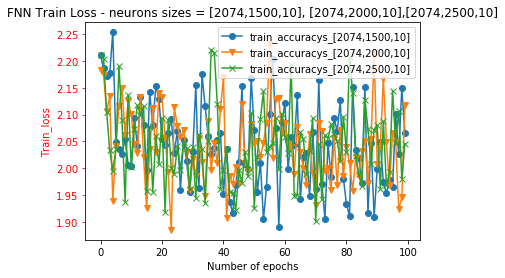

In [168]:
# # Group 3 - Compare the neuron sizes  - neurons sizes = [3072, 2000, 10]  - Train Loss
# plot_compare('Train_loss', 100, 
#              losses_fnn,losses_fnn_2000, losses_fnn_2500, 
#              'train_accuracys_[2074,1500,10]','train_accuracys_[2074,2000,10]', 'train_accuracys_[2074,2500,10]', 
#              'FNN Train Loss - neurons sizes = [2074,1500,10], [2074,2000,10],[2074,2500,10]')

In [154]:
# #Group 4 - Compare the fc layers in CNN - sizes = [2704, 2000, 1500, 10]
# cnn_four = HyperParamsConvNN(kernel_size = 3, image_size = 32, sizes=[2704, 2000, 1500, 10])
# optimizer_cnn_four = optim.SGD(cnn_four.parameters(), lr=0.005, momentum=0.9)
# cnn_res_four = run_experiment_plot(cnn_four, train_loader, test_loader, criterion, optimizer_cnn_four )
# train_accuracys_cnn_four,test_accuracys_cnn_four, losses_cnn_four = cnn_res_four[0], cnn_res_four[1], cnn_res_four[2]   



epoch =  0
Train accuracy:  0.2478
test accuracy:  0.253
epoch =  1
Train accuracy:  0.2557
test accuracy:  0.253
epoch =  2
Train accuracy:  0.3941
test accuracy:  0.373
epoch =  3
Train accuracy:  0.4226
test accuracy:  0.381
epoch =  4
Train accuracy:  0.484
test accuracy:  0.407
epoch =  5
Train accuracy:  0.508
test accuracy:  0.407
epoch =  6
Train accuracy:  0.6053
test accuracy:  0.4425
epoch =  7
Train accuracy:  0.6637
test accuracy:  0.47
epoch =  8
Train accuracy:  0.6925
test accuracy:  0.47
epoch =  9
Train accuracy:  0.7361
test accuracy:  0.4925
epoch =  10
Train accuracy:  0.7635
test accuracy:  0.4555
epoch =  11
Train accuracy:  0.7973
test accuracy:  0.497
epoch =  12
Train accuracy:  0.818
test accuracy:  0.487
epoch =  13
Train accuracy:  0.8331
test accuracy:  0.479
epoch =  14
Train accuracy:  0.8544
test accuracy:  0.481
epoch =  15
Train accuracy:  0.8763
test accuracy:  0.4985
epoch =  16
Train accuracy:  0.8918
test accuracy:  0.5005
epoch =  17
Train accura

In [182]:
# train_accuracys_cnn_four,test_accuracys_cnn_four, losses_cnn_four = cnn_res_four[0], cnn_res_four[1], cnn_res_four[2]   

In [155]:
# #Group 4 - Compare the fc layers - sizes = [2704, 2000, 1500, 500, 10]
# cnn_five = HyperParamsConvNN(kernel_size = 3, image_size = 32, sizes=[2704, 2000, 1500, 500, 10])
# optimizer_cnn_five = optim.SGD(cnn_five.parameters(), lr=0.005, momentum=0.9)
# cnn_res_five = run_experiment_plot(cnn_five, train_loader, test_loader, criterion, optimizer_cnn_five )




epoch =  0
Train accuracy:  0.2321
test accuracy:  0.2205
epoch =  1
Train accuracy:  0.2954
test accuracy:  0.295
epoch =  2
Train accuracy:  0.3602
test accuracy:  0.352
epoch =  3
Train accuracy:  0.3992
test accuracy:  0.384
epoch =  4
Train accuracy:  0.4256
test accuracy:  0.4135
epoch =  5
Train accuracy:  0.4072
test accuracy:  0.3915
epoch =  6
Train accuracy:  0.4447
test accuracy:  0.4215
epoch =  7
Train accuracy:  0.4966
test accuracy:  0.4535
epoch =  8
Train accuracy:  0.492
test accuracy:  0.441
epoch =  9
Train accuracy:  0.5215
test accuracy:  0.4575
epoch =  10
Train accuracy:  0.5121
test accuracy:  0.451
epoch =  11
Train accuracy:  0.5611
test accuracy:  0.459
epoch =  12
Train accuracy:  0.5935
test accuracy:  0.473
epoch =  13
Train accuracy:  0.6158
test accuracy:  0.494
epoch =  14
Train accuracy:  0.6134
test accuracy:  0.4495
epoch =  15
Train accuracy:  0.6641
test accuracy:  0.482
epoch =  16
Train accuracy:  0.7271
test accuracy:  0.504
epoch =  17
Train 

NameError: name 'fnn_res_five' is not defined

In [175]:
# train_accuracys_cnn_five,test_accuracys_cnn_five, losses_cnn_five = cnn_res_five[0], cnn_res_five[1], cnn_res_five[2]   

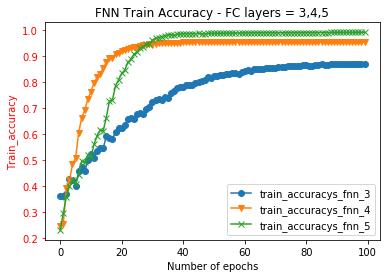

In [185]:
# # Group 4 - Compare the  fc layers ,layers = 3,4,5- Train Accuracy
# plot_compare('Train_accuracy', 100, 
#              train_accuracys_cnn,train_accuracys_cnn_four, train_accuracys_cnn_five, 
#              'train_accuracys_fnn_3','train_accuracys_fnn_4', 'train_accuracys_fnn_5', 
#              'FNN Train Accuracy - FC layers = 3,4,5')


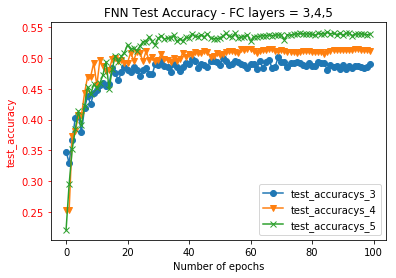

In [186]:
# # Group 4 - Compare the  fc layers ,layers = 3,4,5- Test Accuracy
# plot_compare('test_accuracy', 100, 
#              test_accuracys_cnn,test_accuracys_cnn_four, test_accuracys_cnn_five, 
#              'test_accuracys_3','test_accuracys_4', 'test_accuracys_5', 
#              'FNN Test Accuracy - FC layers = 3,4,5')


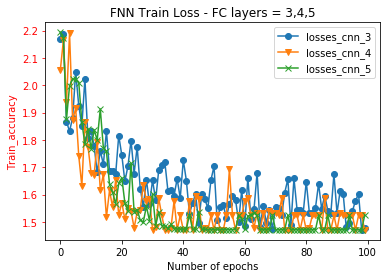

In [187]:
# # Group 4 - Compare the  fc layers ,layers = 3,4,5 - Train Loss
# plot_compare('Train_accuracy', 100, 
#              losses_cnn,losses_cnn_four, losses_cnn_five, 
#              'losses_cnn_3','losses_cnn_4', 'losses_cnn_5', 
#              'FNN Train Loss - FC layers = 3,4,5')

In [190]:
# #Group 5 - Compare the kernel sizes  in CNN - ks = 5X5
# #kernel_size = 3, image_size = 32, sizes=[2704, 2000, 1500, 500, 10]
# cnn_ks5 = HyperParamsConvNN(kernel_size = 5, image_size = 32, sizes=[1600,1500,10])
# optimizer_cnn_ks5 = optim.SGD(cnn_ks5.parameters(), lr=0.001, momentum=0.9)
# cnn_res_ks5 = run_experiment_plot(cnn_ks5, train_loader, test_loader, criterion, optimizer_cnn_ks5 )



epoch =  0
Train accuracy:  0.1845
test accuracy:  0.1755
epoch =  1
Train accuracy:  0.2919
test accuracy:  0.2635
epoch =  2
Train accuracy:  0.3457
test accuracy:  0.2795
epoch =  3
Train accuracy:  0.3762
test accuracy:  0.2895
epoch =  4
Train accuracy:  0.43
test accuracy:  0.314
epoch =  5
Train accuracy:  0.4482
test accuracy:  0.282
epoch =  6
Train accuracy:  0.4882
test accuracy:  0.3035
epoch =  7
Train accuracy:  0.5403
test accuracy:  0.2985
epoch =  8
Train accuracy:  0.5363
test accuracy:  0.2825
epoch =  9
Train accuracy:  0.5862
test accuracy:  0.2925
epoch =  10
Train accuracy:  0.6061
test accuracy:  0.3105
epoch =  11
Train accuracy:  0.6244
test accuracy:  0.2865
epoch =  12
Train accuracy:  0.6235
test accuracy:  0.2875
epoch =  13
Train accuracy:  0.6135
test accuracy:  0.276
epoch =  14
Train accuracy:  0.623
test accuracy:  0.2805
epoch =  15
Train accuracy:  0.6256
test accuracy:  0.281
epoch =  16
Train accuracy:  0.6346
test accuracy:  0.2865
epoch =  17
Tr

NameError: name 'train_accuracys_cnn_ks5' is not defined

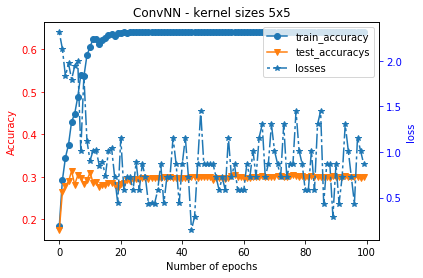

In [191]:
# train_accuracys_cnn_ks5,test_accuracys_cnn_ks5, losses_cnn_ks5 = cnn_res_ks5[0], cnn_res_ks5[1], cnn_res_ks5[2]   
# plot_result(train_accuracys_cnn_ks5,test_accuracys_cnn_ks5,losses_cnn_ks5,100,'ConvNN - kernel sizes 5x5')

epoch =  0
Train accuracy:  0.1036
test accuracy:  0.1015
epoch =  1
Train accuracy:  0.1081
test accuracy:  0.101
epoch =  2
Train accuracy:  0.1142
test accuracy:  0.108
epoch =  3
Train accuracy:  0.1032
test accuracy:  0.101
epoch =  4
Train accuracy:  0.1051
test accuracy:  0.102
epoch =  5
Train accuracy:  0.1028
test accuracy:  0.1
epoch =  6
Train accuracy:  0.1024
test accuracy:  0.1
epoch =  7
Train accuracy:  0.1024
test accuracy:  0.1
epoch =  8
Train accuracy:  0.1023
test accuracy:  0.1
epoch =  9
Train accuracy:  0.1022
test accuracy:  0.1
epoch =  10
Train accuracy:  0.1022
test accuracy:  0.1
epoch =  11
Train accuracy:  0.1034
test accuracy:  0.101
epoch =  12
Train accuracy:  0.1674
test accuracy:  0.1655
epoch =  13
Train accuracy:  0.203
test accuracy:  0.2065
epoch =  14
Train accuracy:  0.1869
test accuracy:  0.1895
epoch =  15
Train accuracy:  0.2119
test accuracy:  0.201
epoch =  16
Train accuracy:  0.2275
test accuracy:  0.2185
epoch =  17
Train accuracy:  0.2

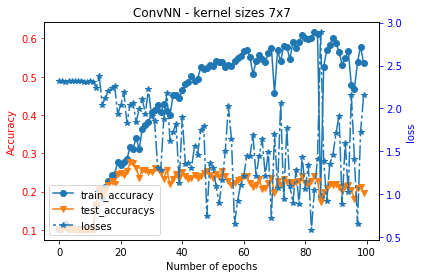

In [193]:
# #Group 5 - Compare the kernel sizes in CNN  - ks = 7X7
# cnn_ks7 = HyperParamsConvNN(kernel_size = 7, image_size = 32, sizes=[784,500,10])
# optimizer_cnn_ks7 = optim.SGD(cnn_ks7.parameters(), lr=0.001, momentum=0.9)
# cnn_res_ks7 = run_experiment_plot(cnn_ks7, train_loader, test_loader, criterion, optimizer_cnn_ks7 )
# train_accuracys_cnn_ks7,test_accuracys_cnn_ks7, losses_cnn_ks7 = cnn_res_ks7[0], cnn_res_ks7[1], cnn_res_ks7[2]   
# plot_result(train_accuracys_cnn_ks7,test_accuracys_cnn_ks7,losses_cnn_ks7,100,'ConvNN - kernel sizes 7x7')


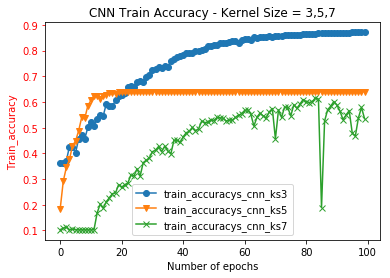

In [194]:
# # Group 5 - Compare the  fc layers ,layers = 3,4,5- Train Accuracy
# plot_compare('Train_accuracy', 100, 
#              train_accuracys_cnn,train_accuracys_cnn_ks5, train_accuracys_cnn_ks7, 
#              'train_accuracys_cnn_ks3','train_accuracys_cnn_ks5', 'train_accuracys_cnn_ks7', 
#              'CNN Train Accuracy - Kernel Size = 3,5,7')

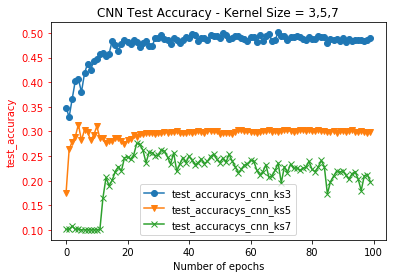

In [195]:
# # Group 5 - Compare the  fc layers ,layers = 3,4,5- Test Accuracy
# plot_compare('test_accuracy', 100, 
#              test_accuracys_cnn, test_accuracys_cnn_ks5, test_accuracys_cnn_ks7, 
#              'test_accuracys_cnn_ks3','test_accuracys_cnn_ks5', 'test_accuracys_cnn_ks7', 
#              'CNN Test Accuracy - Kernel Size = 3,5,7')

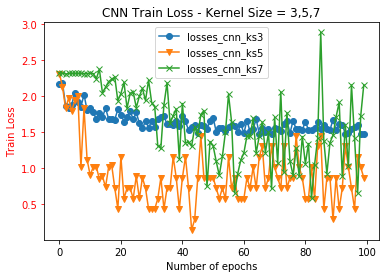

In [197]:
# # Group 5 - Compare the  fc layers ,layers = 3,4,5- Train Loss
# plot_compare('Train Loss', 100, 
#              losses_cnn,losses_cnn_ks5, losses_cnn_ks7, 
#              'losses_cnn_ks3','losses_cnn_ks5', 'losses_cnn_ks7', 
#              'CNN Train Loss - Kernel Size = 3,5,7')